# Fluid dynamics exercises

These notebook contains four exercieses on fluid dynamics:

1. interpret the continuity equation
2. derive and estimate atmospheric scale heights
3. compare the simple scale-height model with an empirical model (NRLMSIS)
4. explore a one-dimensional fluid simulation

The two first exercieses do not require coding (you can write down answers on paper or in a cell in the notebook). Exercise 3 uses an empirical model for the atmosphere which is much used in industry and research. In the final exercise, you can play with a 1D numerical simulation that uses the same conservation equations that we have discussed in the lecture. 

## Exercise 1: Continuity-equation interpretation (no coding)

Consider a one-dimensional, source-free fluid,

$$
\frac{\partial n}{\partial t}+\frac{\partial(nv)}{\partial x}=0.
$$

For each state below, determine the initial value of $\partial n/\partial t$. State where the density increases, where it decreases, and whether the change is caused by advection (transport) of an existing density gradient, convergence or divergence of the velocity, or both. Sketch $n(x)$, $v(x)$, and the sign of $\partial n/\partial t$ before doing the algebra.

1. $n(x)=n_0$ and $v(x)=ax$, with $a>0$.
2. $n(x)=n_0\exp(-x/L)$ and $v(x)=v_0$, with $v_0>0$.
3. $n(x)=n_0\exp(-x/L)$ and $n(x)v(x)=\Gamma_0$, where $\Gamma_0$ is constant.
4. $n(x)=n_0\exp(-x/L)$ and $v(x)=ax$, with $a>0$.

It may be helpful to expand the flux divergence as

$$
\frac{\partial(nv)}{\partial x}
=v\frac{\partial n}{\partial x}+n\frac{\partial v}{\partial x}.
$$

Finally, answer these two questions in words:

- Can a nonuniform density be stationary? If so, under what condition?
- Does $\partial v/\partial x=0$ imply $\partial n/\partial t=0$? Explain.

## Exercise 2: Atmospheric scale height by hand

For a static, isothermal atmosphere with altitude $z$ increasing upward, hydrostatic balance and the ideal-gas pressure law give

$$
\frac{dp}{dz}=-mng,\qquad p=nk_B T.
$$

1. Assuming that $T$ and $g$ are constant, derive

   $$
   n(z)=n(z_0)\exp\left[-\frac{z-z_0}{H}\right],\qquad H=\frac{k_B T}{mg}.
   $$

2. Before calculating, rank $\mathrm{N_2}$, $\mathrm{O_2}$, $\mathrm{O}$, $\mathrm{He}$, and $\mathrm{H}$ from smallest to largest scale height when all species have the same temperature.
3. Calculate $H$ for each species at $T=1000\ \mathrm{K}$ and $g=9.5\ \mathrm{m\,s^{-2}}$. Use $k_B=1.380649\times10^{-23}\ \mathrm{J\,K^{-1}}$ and $m_u=1.660539\times10^{-27}\ \mathrm{kg}$, with particle masses $28m_u$, $32m_u$, $16m_u$, $4m_u$, and $m_u$, respectively.
4. For each species, calculate the altitude interval over which its density falls by a factor of 10.
5. Explain why the relative composition of a diffusively separated upper atmosphere changes with altitude even if all constituents share one temperature.
6. Which assumptions behind the simple exponential profile are least plausible over an altitude range of several hundred kilometres?

## Exercise 3: A realistic atmosphere with NRLMSIS

The exponential model deliberately assumes constant temperature, constant gravity, and one constituent with a fixed particle mass. NRLMSIS is an empirical model in which temperature, composition, solar forcing, geomagnetic forcing, latitude, local time, and season can all affect the neutral atmosphere.

The setup cell below evaluates NRLMSIS 2.1 above Copenhagen for a fixed set of solar and geomagnetic inputs. The returned number densities have units of $\mathrm{m^{-3}}$, temperature is in K, and total mass density is in $\mathrm{kg\,m^{-3}}$.

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import pymsis

date       = np.datetime64("2026-03-20T12:00")
longitude  = 12.6                         # degrees east
latitude   = 55.7                         # degrees north
altitude_km = np.linspace(100.0, 600.0, 501)

f107       = 150.0                        # solar flux units
f107a      = 150.0                        # 81-day mean
aps        = [[7.0] * 7]                  # quiet/moderate geomagnetic activity

msis = pymsis.calculate(
    date,
    longitude,
    latitude,
    altitude_km,
    f107,
    f107a,
    aps,
    version=2.1,
)
msis = np.squeeze(msis)

temperature  = msis[:, pymsis.Variable.TEMPERATURE]
mass_density = msis[:, pymsis.Variable.MASS_DENSITY]

number_density = {
    r"$\mathrm{N_2}$": msis[:, pymsis.Variable.N2],
    r"$\mathrm{O_2}$": msis[:, pymsis.Variable.O2],
    r"$\mathrm{O}$":   msis[:, pymsis.Variable.O],
    r"$\mathrm{He}$":  msis[:, pymsis.Variable.HE],
    r"$\mathrm{H}$":   msis[:, pymsis.Variable.H],
}

### Tasks

1. Plot the temperature against altitude. Over which altitude intervals is the isothermal approximation reasonable?
2. Plot the five number-density profiles on logarithmic horizontal axes. At approximately what altitude does atomic oxygen overtake molecular nitrogen? Which constituents become relatively more important toward the top of the modelled range?
3. The code below calculates a local scale height from each modelled density profile using

   $$
   H_i(z)=-\left(\frac{d\ln n_i}{dz}\right)^{-1}.
   $$

   Explain why this expression returns the ordinary scale height when

   $$
   n_i(z)=n_i(z_0)\exp\left[-\frac{z-z_0}{H_i}\right].
   $$

   Why is it useful to take the derivative of $\ln n_i$ rather than the derivative of $n_i$ itself?
4. Compare the model-derived local scale height with

   $$
   H_{i,\mathrm{hydrostatic}}(z)=\frac{k_B T(z)}{m_i g(z)},\qquad
   g(z)=g_0\left(\frac{R_E}{R_E+z}\right)^2.
   $$

   Where is the agreement good? Identify at least two reasons why the curves need not agree everywhere.
5. Repeat the NRLMSIS calculation after changing **one** input: time of day, season, latitude, solar flux, or geomagnetic activity. State your prediction first, then describe the changes in temperature, mass density, and composition.
6. Based on the comparison, explain what the single number $H$ captures well and what information it necessarily hides.


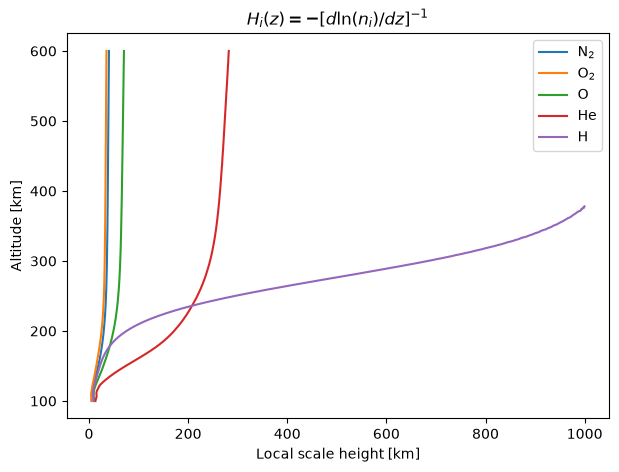

In [2]:
# A minimal skeleton for plotting number density against altitude:
# for label, density in number_density.items():
#     plt.plot(density, altitude_km, label=label)
# plt.xscale("log")
# plt.xlabel(r"Number density [$\mathrm{m^{-3}}$]")
# plt.ylabel("Altitude [km]")
# plt.legend()

# Local scale heights calculated from the NRLMSIS density profiles.
fig, ax = plt.subplots(figsize=(7, 5))

for label, density in number_density.items():
    valid = np.isfinite(density) & (density > 0)

    # altitude_km is measured in km, so H_local is also returned in km.
    H_local = -1.0 / np.gradient(np.log(density[valid]), altitude_km[valid])

    # Numerical derivatives can be unreliable where a constituent is very scarce.
    show = np.isfinite(H_local) & (H_local > 0) & (H_local < 1000)
    ax.plot(H_local[show], altitude_km[valid][show], label=label)

ax.set_xlabel("Local scale height [km]")
ax.set_ylabel("Altitude [km]")
ax.set_title(r"$H_i(z)=-[d\ln(n_i)/dz]^{-1}$")
ax.legend()


## Exercise 4: A one-dimensional neutral-fluid simulation

The simulation assumes an isothermal neutral atmosphere in a periodic one-dimensional domain. A prescribed ion flow pushes the neutrals through ion-neutral collisions. The neutral wind then produces convergence and divergence, density variations, pressure gradients, and propagating disturbances.

The model evolves particle density $n$ and momentum density $mnu$:

$$
\frac{\partial n}{\partial t}
+\frac{\partial(nu)}{\partial x}=0,
$$

$$
\frac{\partial(mnu)}{\partial t}
+\frac{\partial}{\partial x}\left(mnu^2+n k_B T\right)
=mn\nu_{in}(x)[v(x,t)-u]-\frac{mnu}{\tau_d}.
$$

Here $u$ is the neutral velocity and $v$ is the prescribed ion velocity. The first equation is particle conservation. In the second equation, $mnu^2$ transports bulk momentum, $nk_BT$ is the isothermal pressure, $\nu_{in}$ couples the neutral velocity to the ion velocity, and $\tau_d$ represents slow momentum loss to a larger stationary environment.

### Suggested experiments

Run the default case first. For every later experiment, write down your prediction before rerunning the model.

1. Change **forcing_case** from **smooth** to **constant**. Compare gradual and sudden switch-on.
2. Increase or decrease **V0** or **nu_peak**. How do the neutral velocity and density perturbation respond?
3. Choose **sinusoidal** and change **omega**. Can the neutrals follow rapidly varying ion motion?
4. Lower $T$. What happens to the pressure response and propagation speed?
5. Choose **pulse**. What remains after the ion motion ends?

The model and its limitations are explained below before the integration is performed.


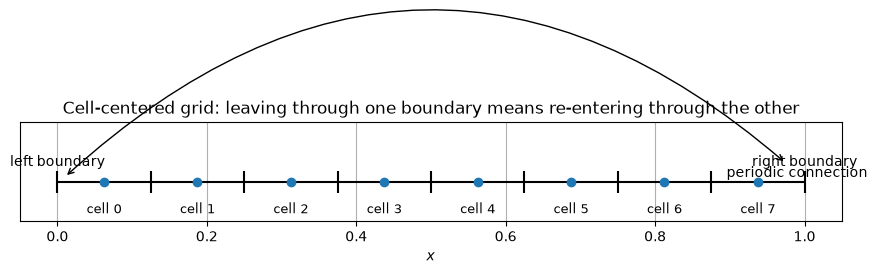

In [3]:
import numpy as np
import matplotlib.pyplot as plt

from matplotlib.animation import FuncAnimation
from IPython.display import HTML

plt.rcParams.update({"figure.figsize": (8, 4.8), "axes.grid": True})

# Schematic grid used to explain the numerical domain.
number_of_schematic_cells = 8
schematic_edges           = np.linspace(0.0, 1.0, number_of_schematic_cells + 1)
schematic_centers         = 0.5 * (schematic_edges[:-1] + schematic_edges[1:])

fig, ax = plt.subplots(figsize=(9, 2.2))
ax.hlines(0.0, 0.0, 1.0, color="black")
ax.vlines(schematic_edges, -0.10, 0.10, color="black")
ax.scatter(schematic_centers, np.zeros_like(schematic_centers), color="tab:blue", zorder=3)

for index, center in enumerate(schematic_centers):
    ax.text(center, -0.18, f"cell {index}", ha="center", va="top", fontsize=9)

ax.annotate(
    "periodic connection",
    xy=(0.01, 0.05),
    xytext=(0.99, 0.05),
    ha="center",
    arrowprops={"arrowstyle": "<->", "connectionstyle": "arc3,rad=0.45"},
)

ax.text(0.0, 0.15, "left boundary",  ha="center")
ax.text(1.0, 0.15, "right boundary", ha="center")
ax.set_xlim(-0.05, 1.05)
ax.set_ylim(-0.35, 0.55)
ax.set_xlabel("$x$")
ax.set_yticks([])
ax.set_title("Cell-centered grid: leaving through one boundary means re-entering through the other")
fig.tight_layout()


### How the numerical model works

The lecture derived conservation laws by applying particle and momentum bookkeeping to a fixed volume. The numerical model applies this same idea to each cell in the discretized one-dimensional domain. 

For one cell, the amount of a conserved quantity changes because:

- flux crosses the left face;
- flux crosses the right face;
- an external process may add or remove that quantity inside the cell.

The continuity and momentum equations can be written one above the other:

$$
\frac{\partial n}{\partial t}
+\frac{\partial(nu)}{\partial x}
=0,
$$

$$
\frac{\partial(mnu)}{\partial t}
+\frac{\partial}{\partial x}\left(mnu^2+n k_BT\right)
=f_{\mathrm{external}}.
$$

We now **stack these two equations** into one vector equation by defining

$$
\mathbf U=
\begin{pmatrix}
n\\
mnu
\end{pmatrix},
\qquad
\mathbf F(\mathbf U)=
\begin{pmatrix}
nu\\
mnu^2+n k_BT
\end{pmatrix},
\qquad
\mathbf Q=
\begin{pmatrix}
0\\
f_{\mathrm{external}}
\end{pmatrix}.
$$

The top row is the continuity equation and the bottom row is the momentum equation. Here $\mathbf Q$ is a **vector of source terms for the conserved quantities**. In this simulation there is no particle production, so its top component is zero; its bottom component contains the forces from ion drag and background drag. 

For cell $i$, the numerical update is

$$
\mathbf U_i(t+\Delta t)
=\mathbf U_i(t)
-\frac{\Delta t}{\Delta x}
\left(\mathbf F_{i+1/2}-\mathbf F_{i-1/2}\right)
+\Delta t\,\mathbf Q_i.
$$

This is the finite-volume form of the two equations: the difference between the right- and left-face fluxes changes what is stored in the cell, while $\mathbf Q_i$ describes exchange with systems outside the neutral fluid. The remaining numerical question is how to estimate a face flux when neighboring cells contain different values. This will be explained below (see cell about the Rusanov flux)


### Parameters and initial state

The defaults use dimensionless units and set $m=k_B=T=1$. This means that the variables have been divided by chosen reference values, so the numbers in the simulation do not carry SI units. The equations retain the same relative balances, but converting the result to meters, seconds, and kilograms would require specifying reference length, density, particle mass, and temperature.

The atmosphere begins at rest with uniform density. A localized collision-frequency profile defines the region where the prescribed ion motion couples most strongly to the neutrals.

Periodic boundaries identify the two ends of the domain: material leaving one side re-enters through the other. The one-dimensional domain can therefore be viewed as a circular coordinate direction, analogous to following a closed direction around a cylinder. This lets us study transport, pressure forces, and momentum exchange without introducing boundary effects. The geometry is idealized, rather than a realistic model of the Earth’s atmosphere.


In [13]:
# Domain and gas parameters
L   = 1.0
nx  = 400
dx  = L / nx
x   = (np.arange(nx) + 0.5) * dx

n0  = 1.0
m   = 1.0
kB  = 1.0
T   = 1.0

# Localized ion-neutral coupling and imposed ion speed
x_forcing = 0.35 * L
width     = 0.07 * L
nu_peak   = 4.0
V0        = 0.35

# Weak global momentum loss and integration controls
tau_d = 8.0
t_end = 10.0
CFL   = 0.45

# Periodic distance from the center of the forcing region
distance = (x - x_forcing + 0.5 * L) % L - 0.5 * L
f        = np.exp(-0.5 * (distance / width)**2)
nu_in    = nu_peak * f

# Uniform atmosphere at rest.  mnu is the momentum density m*n*u.
n   = n0 * np.ones(nx)
mnu = np.zeros(nx)

### Choose the prescribed ion motion

We impose an ion velocity $v(x,t)$ that, through collisions, push the neutral fluid that we simulate. Change **forcing_case** to select a sudden, smooth, sinusoidal, or pulsed ion flow; the same localized spatial profile is used in every case.


In [14]:
forcing_case = "smooth"       # "constant", "smooth", "sinusoidal", or "pulse"
t_rise       = 0.10
omega        = 2.0 * np.pi / 0.50
pulse_start  = 0.20
pulse_end    = 0.70

def ion_velocity(x, t):
    # Prescribed v(x,t); the short branches are intended for student editing.
    if forcing_case == "constant":
        g = 1.0
    elif forcing_case == "smooth":
        g = 1.0 - np.exp(-t / t_rise)
    elif forcing_case == "sinusoidal":
        g = np.sin(omega * t)
    elif forcing_case == "pulse":
        edge = 0.03
        g = 0.5 * (np.tanh((t - pulse_start) / edge)
                 - np.tanh((t - pulse_end)   / edge))
    else:
        raise ValueError("Unknown forcing_case")

    return V0 * f * g

### Inspect the imposed forcing

Before integrating the fluid equations, plot the two externally prescribed quantities:

- $\nu_{in}(x)$ tells us where ion-neutral coupling is strong
- $v(x,t)$ tells us the velocity toward which collisions push the neutral gas.

Their localization loosely resembles forcing in a limited high-latitude region.


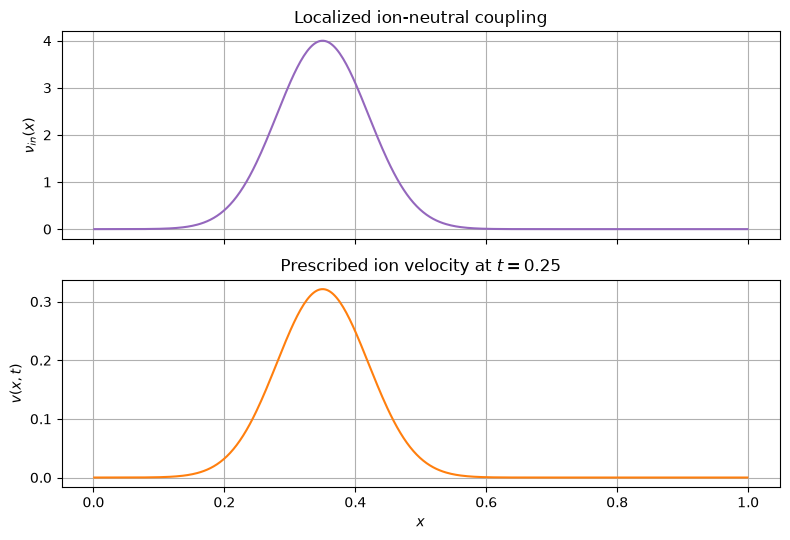

In [15]:
t_representative = 0.25

fig, axes = plt.subplots(2, 1, sharex=True, figsize=(8, 5.5))
axes[0].plot(x, nu_in, color="tab:purple")
axes[0].set_ylabel(r"$\nu_{in}(x)$")
axes[0].set_title("Localized ion-neutral coupling")

axes[1].plot(x, ion_velocity(x, t_representative), color="tab:orange")
axes[1].set_ylabel(r"$v(x,t)$")
axes[1].set_xlabel(r"$x$")
axes[1].set_title(fr"Prescribed ion velocity at $t={t_representative:g}$")
plt.tight_layout()
plt.show()

### Pressure disturbances and relevant timescales

There are three useful timescales:

- $L/c_s$: time for a pressure disturbance to cross the domain;
- $1/\nu_{in}$: local time for collisions to pull neutrals toward the ion velocity;
- $\tau_d$: time for the background drag to remove neutral momentum.

Comparing these timescales helps predict the response before running the model.


In [16]:
pressure_wave_speed = np.sqrt(kB * T / m)
crossing_time       = L / pressure_wave_speed
collision_time      = 1.0 / nu_peak

print(f"pressure-wave speed sqrt(kB*T/m)   : {pressure_wave_speed:.3f}")
print(f"domain-crossing time L/c           : {crossing_time:.3f}")
print(f"minimum collision time 1/nu_peak   : {collision_time:.3f}")
print(f"background momentum-loss time tau_d: {tau_d:.3f}")

if forcing_case == "smooth":
    print(f"forcing switch-on time t_rise      : {t_rise:.3f}")
elif forcing_case == "sinusoidal":
    print(f"forcing period 2*pi/omega          : {2*np.pi/omega:.3f}")
elif forcing_case == "pulse":
    print(f"pulse duration                     : {pulse_end-pulse_start:.3f}")


pressure-wave speed sqrt(kB*T/m)   : 1.000
domain-crossing time L/c           : 1.000
minimum collision time 1/nu_peak   : 0.250
background momentum-loss time tau_d: 8.000
forcing switch-on time t_rise      : 0.100


### The Rusanov interface flux

The physical flux $F(U)$ is known at cell centers, but the update requires a flux at each cell face. Neighboring cells generally predict different face fluxes. The **Rusanov flux** uses their average and adds a smoothing term proportional to their difference:

$$
F_{i+1/2}^{\mathrm{Rus}}
=\frac{F_i+F_{i+1}}{2}
-\frac{a_{i+1/2}}{2}(U_{i+1}-U_i),
$$

where

$$
a_{i+1/2}
=\max\left(|u_i|+c,\ |u_{i+1}|+c\right).
$$

Conceptually:

- the average estimates transport through the face;
- the second term prevents unresolved cell-to-cell oscillations by mixing information over the fastest local propagation distance;
- the same face flux leaves one cell and enters its neighbor, so the update remains conservative.

The price of this robustness is numerical diffusion: sharp structures become smoother than they would in the exact equations. Rusanov is used here because the bookkeeping is visible and the method remains stable when waves steepen.


In [17]:
def rusanov_flux(n, mnu):
    u = mnu / (m * n)

    # Physical flux F = (n*u, m*n*u**2 + n*kB*T).
    F_n   = n * u
    F_mnu = m * n * u**2 + n * kB * T

    # The right neighbor of each cell supplies the other side of every face.
    n_R     = np.roll(n,   -1)
    mnu_R   = np.roll(mnu, -1)
    u_R     = mnu_R / (m * n_R)
    F_n_R   = n_R * u_R
    F_mnu_R = m * n_R * u_R**2 + n_R * kB * T

    # Fastest local transport or pressure-wave speed at each face.
    a = np.maximum(np.abs(u)   + pressure_wave_speed,
                   np.abs(u_R) + pressure_wave_speed)

    # Average physical flux minus the Rusanov smoothing term.
    flux_n   = 0.5 * (F_n   + F_n_R)   - 0.5 * a * (n_R   - n)
    flux_mnu = 0.5 * (F_mnu + F_mnu_R) - 0.5 * a * (mnu_R - mnu)

    return flux_n, flux_mnu


### Integrate in time

The loop repeatedly performs three operations:

1. choose a sufficiently small timestep;
2. update density and momentum from the difference between right- and left-face fluxes;
3. apply ion drag and background momentum loss inside each cell.

The timestep is limited so that neither fluid propagation nor drag changes a cell by too much in one step. Snapshots and animation frames are stored only when requested.


In [18]:
# Choose one stable timestep for the entire run.
maximum_expected_speed = V0 + pressure_wave_speed
dt_wave                = CFL * dx / maximum_expected_speed
dt_ion                 = 0.15 / nu_peak
dt_drag                = 0.15 * tau_d
dt                     = min(dt_wave, dt_ion, dt_drag)

number_of_steps = int(np.ceil(t_end / dt))
dt              = t_end / number_of_steps

# Store six snapshots and at most about 100 animation frames.
snapshot_times = np.array([0.00, 0.25, 0.50, 1.00, 1.50, 2.00])
snapshot_steps = {
    int(round(snapshot_time / dt)): snapshot_time
    for snapshot_time in snapshot_times
}
frame_stride = max(1, number_of_steps // 300)

snapshots        = {}
frames_n         = []
frames_mnu       = []
saved_frame_times = []

times              = []
total_particles    = []
total_momentum     = []
ion_force_history  = []
drag_force_history = []

for step in range(number_of_steps + 1):
    t = step * dt
    u = mnu / (m * n)

    # Save the present state before taking the next step.
    if step in snapshot_steps:
        snapshots[snapshot_steps[step]] = (n.copy(), mnu.copy())

    if step % frame_stride == 0 or step == number_of_steps:
        frames_n.append(n.copy())
        frames_mnu.append(mnu.copy())
        saved_frame_times.append(t)

    # Store quantities used only by the optional diagnostic at the end.
    ion_drag       = m * n * nu_in * (ion_velocity(x, t) - u)
    background_drag = -mnu / tau_d

    times.append(t)
    total_particles.append(np.sum(n) * dx)
    total_momentum.append(np.sum(mnu) * dx)
    ion_force_history.append(np.sum(ion_drag) * dx)
    drag_force_history.append(np.sum(background_drag) * dx)

    if step == number_of_steps:
        break

    # 1. Transport particles and momentum between neighboring cells.
    flux_n, flux_mnu = rusanov_flux(n, mnu)
    n   = n   - dt / dx * (flux_n   - np.roll(flux_n,   1))
    mnu = mnu - dt / dx * (flux_mnu - np.roll(flux_mnu, 1))

    # 2. Exchange momentum with the prescribed ions and background.
    u               = mnu / (m * n)
    v               = ion_velocity(x, t)
    ion_drag        = m * n * nu_in * (v - u)
    mnu             = mnu + dt * ion_drag
    background_drag = -mnu / tau_d
    mnu             = mnu + dt * background_drag

times              = np.asarray(times)
total_particles    = np.asarray(total_particles)
total_momentum     = np.asarray(total_momentum)
ion_force_history  = np.asarray(ion_force_history)
drag_force_history = np.asarray(drag_force_history)

print(f"completed {number_of_steps} steps; dt = {dt:.5f}; minimum n = {n.min():.4f}")


completed 12000 steps; dt = 0.00083; minimum n = 0.9776


### Examine the neutral response

The wind first appears where collisions couple the neutrals to the prescribed ion motion. Spatial variation in $u$ creates convergence on one side of the forcing region and divergence on the other through $\partial(nu)/\partial x$. Density and pressure consequently change, and the pressure gradient launches disturbances away from the forcing region.

Relate every visible feature to a term in the two fluid equations before changing the parameters.


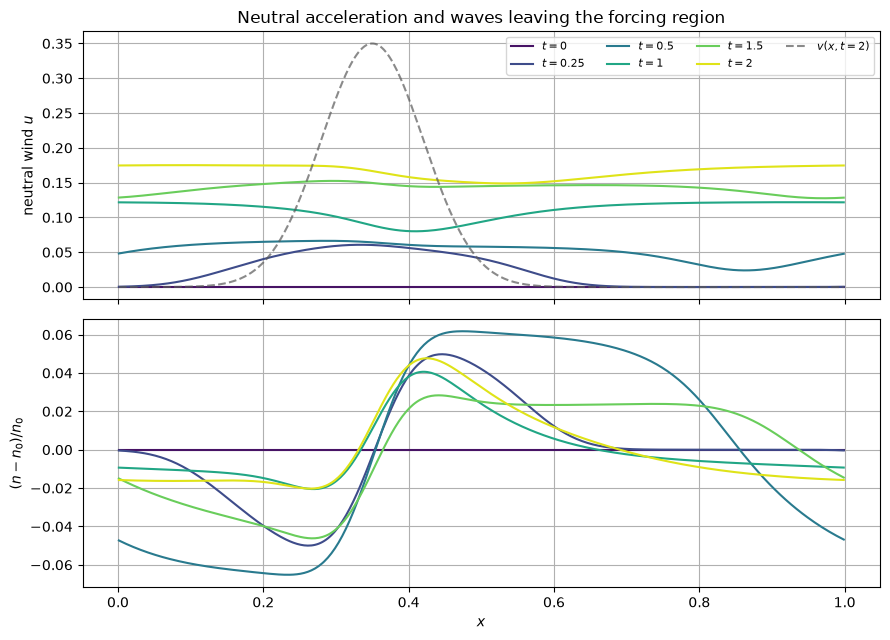

In [19]:
colors = plt.cm.viridis(np.linspace(0.05, 0.95, len(snapshot_times)))
fig, axes = plt.subplots(2, 1, sharex=True, figsize=(9, 6.5))

for color, ts in zip(colors, snapshot_times):
    n_s, mnu_s = snapshots[float(ts)]
    u_s = mnu_s / (m * n_s)
    axes[0].plot(x, u_s, color=color, label=fr"$t={ts:g}$")
    axes[1].plot(x, (n_s - n0) / n0, color=color)

axes[0].plot(x, ion_velocity(x, snapshot_times[-1]), "--", color="0.35", alpha=0.7,
             label=fr"$v(x,t={snapshot_times[-1]:g})$")
axes[0].set_ylabel(r"neutral wind $u$")
axes[0].set_title("Neutral acceleration and waves leaving the forcing region")
axes[0].legend(ncol=4, fontsize=8)
axes[1].set_ylabel(r"$(n-n_0)/n_0$")
axes[1].set_xlabel(r"$x$")
plt.tight_layout()
plt.show()

### Animate the response

The dashed curve is the prescribed ion velocity and the solid curve is the neutral velocity. The lower panel shows the relative density perturbation. For sinusoidal forcing, compare the forcing period with $1/\nu_{in}$ and look for amplitude reduction and phase lag.


In [20]:
frames_n    = np.asarray(frames_n)
frames_mnu  = np.asarray(frames_mnu)
frames_u    = frames_mnu / (m * frames_n)
frames_delta_n = (frames_n - n0) / n0

u_limit = 1.1 * max(np.max(np.abs(frames_u)), V0)
n_limit = 1.1 * np.max(np.abs(frames_delta_n))

fig, axes = plt.subplots(2, 1, sharex=True, figsize=(8, 6))
line_u, = axes[0].plot([], [], color="tab:blue", label=r"neutral $u$")
line_v, = axes[0].plot([], [], "--", color="tab:orange", alpha=0.7, label=r"ion $v$")
line_n, = axes[1].plot([], [], color="tab:green")
time_text = axes[0].text(0.02, 0.90, "", transform=axes[0].transAxes)

axes[0].set_xlim(0, L)
axes[0].set_ylim(-u_limit, u_limit)
axes[1].set_ylim(-n_limit, n_limit)
axes[0].set_ylabel(r"velocity")
axes[1].set_ylabel(r"$(n-n_0)/n_0$")
axes[1].set_xlabel(r"$x$")
axes[0].legend()

def update(frame):
    t_frame = saved_frame_times[frame]
    line_u.set_data(x, frames_u[frame])
    line_v.set_data(x, ion_velocity(x, t_frame))
    line_n.set_data(x, frames_delta_n[frame])
    time_text.set_text(fr"$t={t_frame:.2f}$")
    return line_u, line_v, line_n, time_text

animation = FuncAnimation(fig, update, frames=len(saved_frame_times), interval=60, blit=True)
plt.close(fig)
HTML(animation.to_jshtml())

### Optional extension: particle production and loss

The main model uses $S=0$. A separate experiment could add

$$
S=P(x)-\frac{n-n_0}{\tau_n}.
$$

Adding or removing particles also requires a momentum decision. If new particles enter with velocity $u_s$, production supplies momentum $mPu_s$. Particles lost at the local fluid velocity carry away momentum $m[(n-n_0)/\tau_n]u$.

This illustrates why evolving $n$ and $mnu$ is useful: particle and momentum bookkeeping remain explicit. It would be inconsistent to create or remove particles without specifying the momentum they carry.


### Equation-term map

| Process | Equation term | What to look for |
|---|---|---|
| Particle transport | $\partial(nu)/\partial x$ | convergence compresses; divergence rarefies |
| Bulk momentum transport | $\partial(mnu^2)/\partial x$ | moving gas transports its own momentum |
| Pressure | $\partial(nk_BT)/\partial x$ | pressure gradients accelerate the gas |
| Ion-neutral coupling | $mn\nu_{in}(v-u)$ | the neutral velocity is pulled toward the ion velocity |
| Background momentum loss | $-mnu/\tau_d$ | the domain-mean momentum remains bounded |

The flux terms redistribute particles and momentum between cells. The source terms exchange momentum with systems outside the neutral fluid.


### Optional final check: conservation and momentum budget

This diagnostic is not needed to understand the main physical result. It checks that the numerical bookkeeping behaves as intended.

With $S=0$ and periodic boundaries, every face flux that leaves one cell enters another, so total particle number should remain constant apart from roundoff error. Total neutral momentum need not remain constant because ion drag adds momentum and background drag removes it. The measured momentum change should match the integrated source terms.


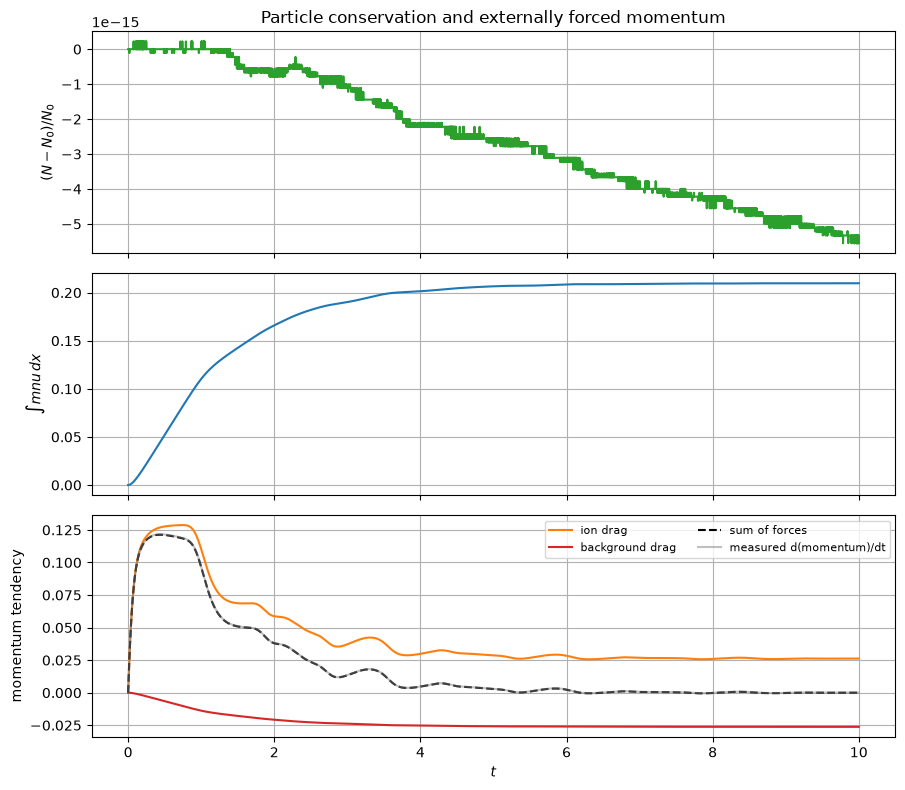

maximum relative particle-number error: 5.551e-15
initial total momentum: 0.000000
final total momentum:   0.209744


In [21]:
relative_number_error = (total_particles - total_particles[0]) / total_particles[0]
measured_momentum_tendency = np.gradient(total_momentum, times)
predicted_momentum_tendency = ion_force_history + drag_force_history

fig, axes = plt.subplots(3, 1, sharex=True, figsize=(9, 8))
axes[0].plot(times, relative_number_error, color="tab:green")
axes[0].set_ylabel(r"$(N-N_0)/N_0$")
axes[0].set_title("Particle conservation and externally forced momentum")

axes[1].plot(times, total_momentum, color="tab:blue")
axes[1].set_ylabel(r"$\int mnu\,dx$")

axes[2].plot(times, ion_force_history, label="ion drag", color="tab:orange")
axes[2].plot(times, drag_force_history, label="background drag", color="tab:red")
axes[2].plot(times, predicted_momentum_tendency, "k--", label="sum of forces")
axes[2].plot(times, measured_momentum_tendency, color="0.5", alpha=0.5,
             label="measured d(momentum)/dt")
axes[2].set_ylabel("momentum tendency")
axes[2].set_xlabel(r"$t$")
axes[2].legend(ncol=2, fontsize=8)
plt.tight_layout()
plt.show()

print(f"maximum relative particle-number error: {np.max(np.abs(relative_number_error)):.3e}")
print(f"initial total momentum: {total_momentum[0]:.6f}")
print(f"final total momentum:   {total_momentum[-1]:.6f}")